In [2]:
#import libraries
from scipy.interpolate import interp1d
import plotly.express as px
import pandas as pd
import numpy as np
import matplotlib
import matplotlib.pyplot as plt
import matplotlib.mlab as mlab
import seaborn as sns

plt.style.use('ggplot')
from matplotlib.pyplot import figure
%matplotlib inline
matplotlib.rcParams['figure.figsize'] = (12,8)

In [6]:
#read the data
data = pd.read_csv(r'/Users/jnthn/Downloads/AB_NYC_2019.csv')
data.head()

,id,name,host_id,host_name,neighbourhood_group,neighbourhood,latitude,longitude,room_type,price,minimum_nights,number_of_reviews,last_review,reviews_per_month,calculated_host_listings_count,availability_365
0,2539,Clean & quiet apt home by the park,2787,John,Brooklyn,Kensington,40.64749,-73.97237,Private room,149,1,9,2018-10-19,0.21,6,365
1,2595,Skylit Midtown Castle,2845,Jennifer,Manhattan,Midtown,40.75362,-73.98377,Entire home/apt,225,1,45,2019-05-21,0.38,2,355
2,3647,THE VILLAGE OF HARLEM....NEW YORK !,4632,Elisabeth,Manhattan,Harlem,40.80902,-73.94190,Private room,150,3,0,NaN,NaN,1,365
3,3831,Cozy Entire Floor of Brownstone,4869,LisaRoxanne,Brooklyn,Clinton Hill,40.68514,-73.95976,Entire home/apt,89,1,270,2019-07-05,4.64,1,194
4,5022,Entire Apt: Spacious Studio/Loft by central park,7192,Laura,Manhattan,East Harlem,40.79851,-73.94399,Entire home/apt,80,10,9,2018-11-19,0.10,1,0


# <font size="15">Data Cleaning:</font>

In [7]:
#checking to see which columns have no data

for col in data.columns:
    pct_missing = np.mean(data[col].isnull())
    print('{} - {}%'.format(col, round(pct_missing*100)))

id - 0%
name - 0%
host_id - 0%
host_name - 0%
neighbourhood_group - 0%
neighbourhood - 0%
latitude - 0%
longitude - 0%
room_type - 0%
price - 0%
minimum_nights - 0%
number_of_reviews - 0%
last_review - 21%
reviews_per_month - 21%
calculated_host_listings_count - 0%
availability_365 - 0%


In [8]:
#filling in the data needed for 'reviews_per_month' to not show 'NaN'

data['reviews_per_month'].fillna(0,inplace=True)
data.head()

,id,name,host_id,host_name,neighbourhood_group,neighbourhood,latitude,longitude,room_type,price,minimum_nights,number_of_reviews,last_review,reviews_per_month,calculated_host_listings_count,availability_365
0,2539,Clean & quiet apt home by the park,2787,John,Brooklyn,Kensington,40.64749,-73.97237,Private room,149,1,9,2018-10-19,0.21,6,365
1,2595,Skylit Midtown Castle,2845,Jennifer,Manhattan,Midtown,40.75362,-73.98377,Entire home/apt,225,1,45,2019-05-21,0.38,2,355
2,3647,THE VILLAGE OF HARLEM....NEW YORK !,4632,Elisabeth,Manhattan,Harlem,40.80902,-73.94190,Private room,150,3,0,NaN,0.00,1,365
3,3831,Cozy Entire Floor of Brownstone,4869,LisaRoxanne,Brooklyn,Clinton Hill,40.68514,-73.95976,Entire home/apt,89,1,270,2019-07-05,4.64,1,194
4,5022,Entire Apt: Spacious Studio/Loft by central park,7192,Laura,Manhattan,East Harlem,40.79851,-73.94399,Entire home/apt,80,10,9,2018-11-19,0.10,1,0


In [9]:
#filling in the data needed for 'last_review' to show that there are no reviews for that property

data['last_review'].fillna('No Reviews',inplace=True)
data.head()

,id,name,host_id,host_name,neighbourhood_group,neighbourhood,latitude,longitude,room_type,price,minimum_nights,number_of_reviews,last_review,reviews_per_month,calculated_host_listings_count,availability_365
0,2539,Clean & quiet apt home by the park,2787,John,Brooklyn,Kensington,40.64749,-73.97237,Private room,149,1,9,2018-10-19,0.21,6,365
1,2595,Skylit Midtown Castle,2845,Jennifer,Manhattan,Midtown,40.75362,-73.98377,Entire home/apt,225,1,45,2019-05-21,0.38,2,355
2,3647,THE VILLAGE OF HARLEM....NEW YORK !,4632,Elisabeth,Manhattan,Harlem,40.80902,-73.94190,Private room,150,3,0,No Reviews,0.00,1,365
3,3831,Cozy Entire Floor of Brownstone,4869,LisaRoxanne,Brooklyn,Clinton Hill,40.68514,-73.95976,Entire home/apt,89,1,270,2019-07-05,4.64,1,194
4,5022,Entire Apt: Spacious Studio/Loft by central park,7192,Laura,Manhattan,East Harlem,40.79851,-73.94399,Entire home/apt,80,10,9,2018-11-19,0.10,1,0


In [10]:
#re-running to check and make sure each column has data

for col in data.columns:
    pct_missing = np.mean(data[col].isnull())
    print('{} - {}%'.format(col, round(pct_missing*100)))

id - 0%
name - 0%
host_id - 0%
host_name - 0%
neighbourhood_group - 0%
neighbourhood - 0%
latitude - 0%
longitude - 0%
room_type - 0%
price - 0%
minimum_nights - 0%
number_of_reviews - 0%
last_review - 0%
reviews_per_month - 0%
calculated_host_listings_count - 0%
availability_365 - 0%


In [11]:
#looking at the type of each column for further analysis if needed

print(data.dtypes)

id                                  int64
name                               object
host_id                             int64
host_name                          object
neighbourhood_group                object
neighbourhood                      object
latitude                          float64
longitude                         float64
room_type                          object
price                               int64
minimum_nights                      int64
number_of_reviews                   int64
last_review                        object
reviews_per_month                 float64
calculated_host_listings_count      int64
availability_365                    int64
dtype: object


In [12]:
#remove duplicates in the data

data['id'].drop_duplicates().sort_values(ascending=False)

#luckily there are no duplicates in the dataset

48894    36487245
48893    36485609
48892    36485431
48891    36485057
48890    36484665
           ...   
4            5022
3            3831
2            3647
1            2595
0            2539
Name: id, Length: 48895, dtype: int64

# <font size="15">Scatter Mapbox:</font>

In [24]:
#creating a list to evaluate the data in 'reviews_per_month' and present it as a heat map

list1 = data.reviews_per_month.values.tolist()
len(list1)

48895

In [25]:
#create heatmap with locations of airbnb's to show which places get the most reviews per month

m = interp1d([0,max(list1)],[1,20])
circle_radius = m(list1)

open-street-map


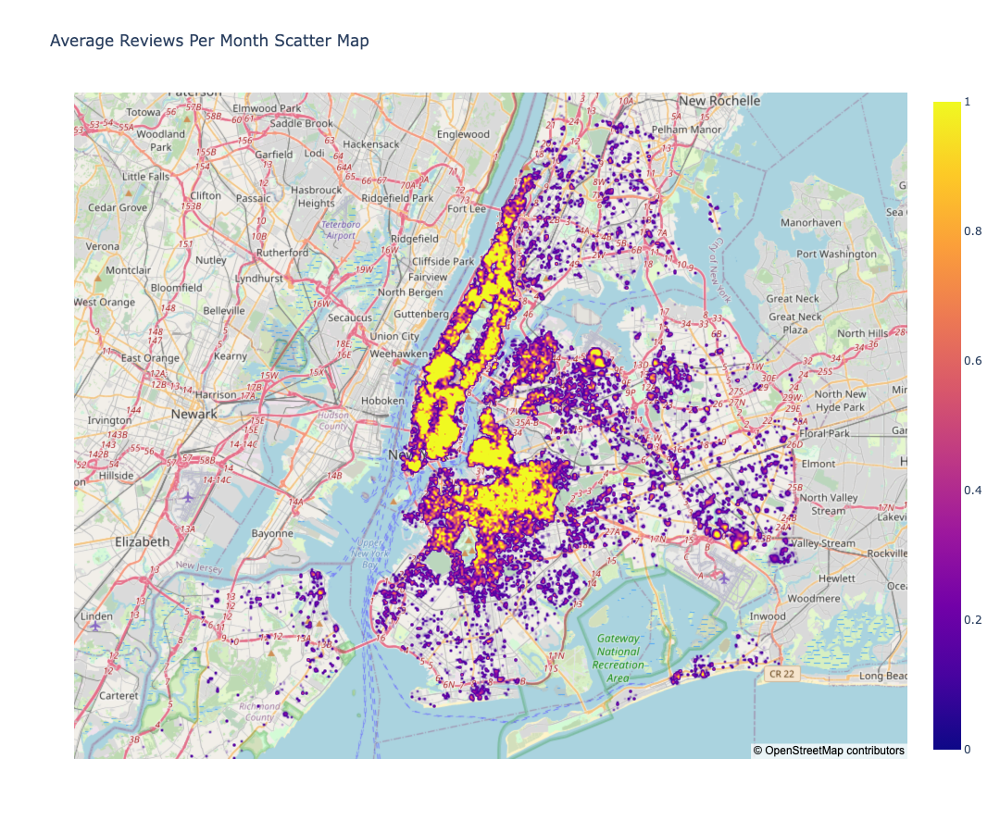

In [26]:
#in here we created a map of New York with density plots to show where airbnb locations are being rented out the most based on number of reviews per month
#typelist contains all of the various themes we want to use

typelist = ['open-street-map']
#can use these themes in typelist too: ['open-street-map', 'white-bg','carto-positron','carto-darkmatter','stamen-terrain','stamen-toner','stamen-watercolor']

#used a loop to show data for each of the themes above
for i in typelist:
    print(i)
    fig = px.density_mapbox(data, lat='latitude',lon='longitude', radius=circle_radius,zoom=10, mapbox_style=i, width=1200, height=900, title='Average Reviews Per Month Scatter Map')
    fig.show()

In [27]:
#from the data above we can see that in the NYC/Brooklyn area it is more heavily populated with reviews. This could also be due to more people renting in these areas and not just soley based on reviews.

# <font size="15">Data Exploration and Outliers:</font>

In [28]:
#sorting the data to see if there are any outliers we can get rid of
#we will try to remove outliers in 'reviews_per_month' and 'minimum_nights'

sort = data.sort_values(by=['minimum_nights'], inplace=False, ascending=False)
sort.head()

,id,name,host_id,host_name,neighbourhood_group,neighbourhood,latitude,longitude,room_type,price,minimum_nights,number_of_reviews,last_review,reviews_per_month,calculated_host_listings_count,availability_365
5767,4204302,Prime W. Village location 1 bdrm,17550546,Genevieve,Manhattan,Greenwich Village,40.73293,-73.99782,Entire home/apt,180,1250,2,2014-11-09,0.03,1,365
2854,1615764,NaN,6676776,Peter,Manhattan,Battery Park City,40.71239,-74.01620,Entire home/apt,400,1000,0,No Reviews,0.00,1,362
38664,30378211,Shared Studio (females only),200401254,Meg,Manhattan,Greenwich Village,40.73094,-73.99900,Shared room,110,999,0,No Reviews,0.00,1,365
13404,10053943,Historic Designer 2 Bed. Apartment,2697686,Glenn H.,Manhattan,Harlem,40.82915,-73.94034,Entire home/apt,99,999,2,2018-01-04,0.07,1,42
26341,20990053,Beautiful place in Brooklyn! #2,151084261,Angie,Brooklyn,Williamsburg,40.71772,-73.95059,Private room,79,999,24,2018-06-28,1.12,6,249


In [29]:
sort = data.sort_values(by=['reviews_per_month'], inplace=False, ascending=False)
sort.head()

,id,name,host_id,host_name,neighbourhood_group,neighbourhood,latitude,longitude,room_type,price,minimum_nights,number_of_reviews,last_review,reviews_per_month,calculated_host_listings_count,availability_365
42075,32678719,Enjoy great views of the City in our Deluxe Room!,244361589,Row NYC,Manhattan,Theater District,40.75918,-73.98801,Private room,100,1,156,2019-07-07,58.50,9,299
42076,32678720,Great Room in the heart of Times Square!,244361589,Row NYC,Manhattan,Theater District,40.75828,-73.98876,Private room,199,1,82,2019-07-07,27.95,9,299
38870,30423106,Lou's Palace-So much for so little,228415932,Louann,Queens,Rosedale,40.65417,-73.74158,Private room,45,1,37,2019-07-08,20.94,1,134
27287,21550302,JFK Comfort.5 Mins from JFK Private Bedroom & ...,156684502,Nalicia,Queens,Springfield Gardens,40.66110,-73.76830,Private room,80,1,403,2019-07-06,19.75,3,26
28651,22176831,JFK 2 Comfort 5 Mins from JFK Private Bedroom,156684502,Nalicia,Queens,Springfield Gardens,40.66158,-73.77050,Private room,50,1,341,2019-07-08,17.82,3,25


# Minimum Nights (outliers)

<Axes: >

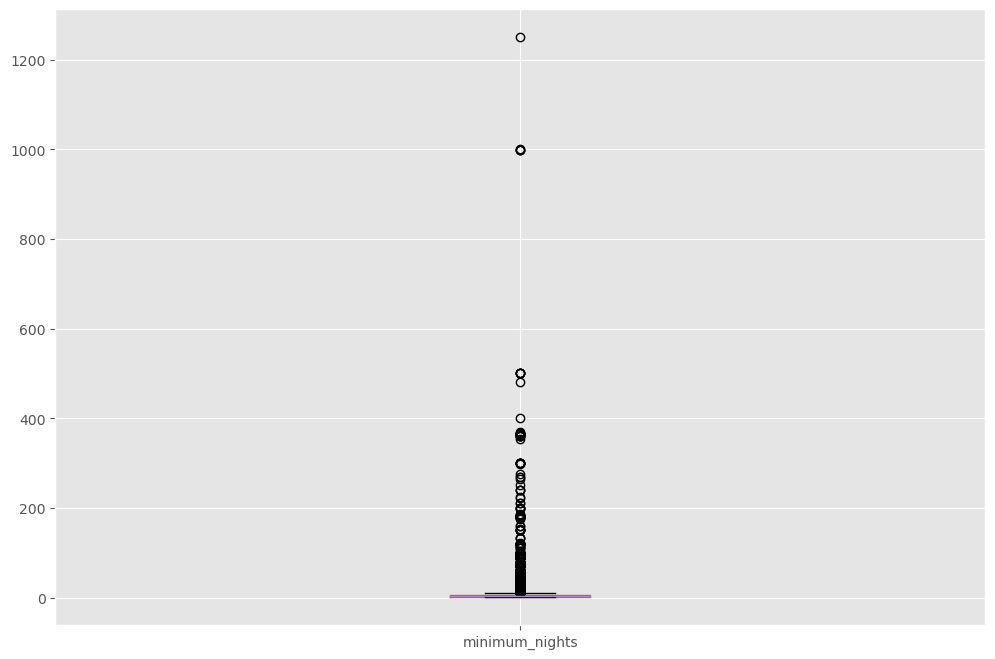

In [30]:
#checking for outliers in the data

data.boxplot(column=['minimum_nights'])
#can also use the following code: sns.boxplot(data['minimum_nights'])

/var/folders/_v/t3gd_z7x5wbc80jcl_mtc8lm0000gn/T/ipykernel_24021/3566135931.py:2: UserWarning:



`distplot` is a deprecated function and will be removed in seaborn v0.14.0.

Please adapt your code to use either `displot` (a figure-level function with
similar flexibility) or `histplot` (an axes-level function for histograms).

For a guide to updating your code to use the new functions, please see
https://gist.github.com/mwaskom/de44147ed2974457ad6372750bbe5751




<Axes: xlabel='minimum_nights', ylabel='Density'>

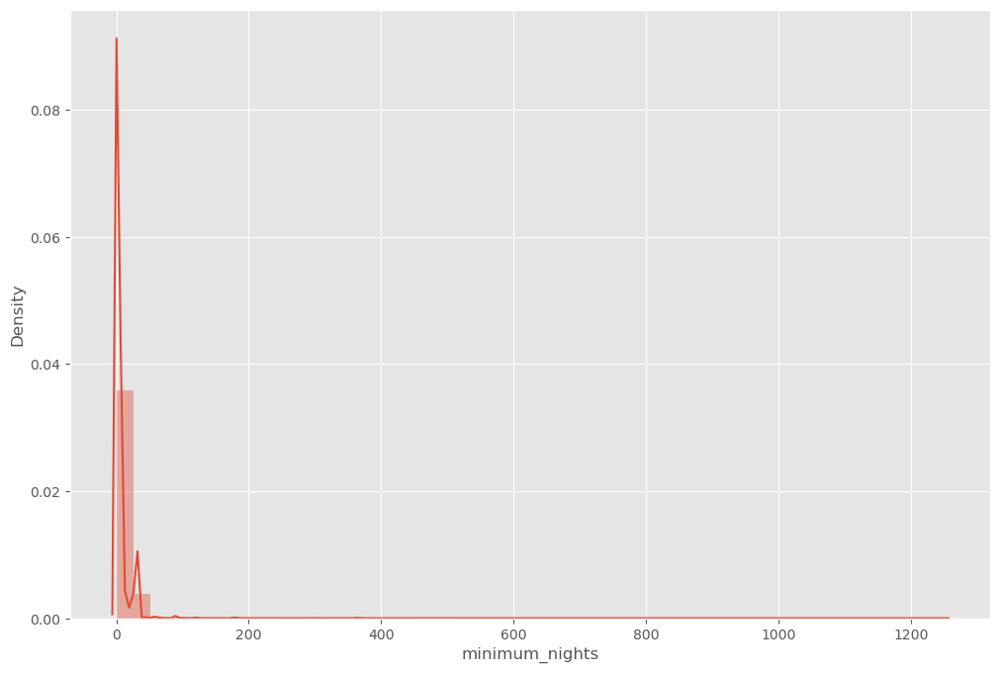

In [59]:
#checking for outliers in the data
sns.distplot(data['minimum_nights'])

#the data is very right-skewed, so we must make adjustments

In [57]:
#let's remove these outliers so that we can use our data properly
upper = data['minimum_nights'].mean() + 3*data['minimum_nights'].std()
lower = data['minimum_nights'].mean() - 3*data['minimum_nights'].std()
print('Upper:',upper,'|','Lower:',lower)

Upper: 68.56161076336177 | Lower: -54.501686435720906


In [37]:
#so we can visually see the outliers, let us make a script to do so

data.loc[(data['minimum_nights'] > upper) | (data['minimum_nights'] < lower)].head()

,id,name,host_id,host_name,neighbourhood_group,neighbourhood,latitude,longitude,room_type,price,minimum_nights,number_of_reviews,last_review,reviews_per_month,calculated_host_listings_count,availability_365
14,6090,West Village Nest - Superhost,11975,Alina,Manhattan,West Village,40.73530,-74.00525,Entire home/apt,120,90,27,2018-10-31,0.22,1,0
61,15396,Sunny & Spacious Chelsea Apartment,60278,Petra,Manhattan,Chelsea,40.74623,-73.99530,Entire home/apt,375,180,5,2018-11-03,0.12,1,180
106,25235,Large 2 Bedroom Great for Groups!,87773,Shelly,Brooklyn,Bedford-Stuyvesant,40.68373,-73.92377,Entire home/apt,125,90,162,2019-06-28,1.46,2,137
245,61509,"Quiet, clean midtown apt w. elevato",23619,Anna/Fonzy,Manhattan,Midtown,40.75749,-73.96897,Entire home/apt,110,200,92,2019-04-30,0.90,1,140
349,94209,LARGE 1BR (CONV 2BR) CROWN HEIGHTS,503800,Sadatu,Brooklyn,Crown Heights,40.67473,-73.94494,Entire home/apt,100,90,0,No Reviews,0.00,1,365


In [38]:
#let's remove the outliers in 'minimum_nights' and assign it as new_data

new_data = data.loc[(data['minimum_nights'] < upper) & (data['minimum_nights'] > lower)]
print('old data:', len(data))
print('new data:', len(new_data))
print('outliers removed:', len(data)-len(new_data))

old data: 48895
new data: 48568
outliers removed: 327


In [39]:
#the new data should be adjusted

sort2 = new_data.sort_values(by=['minimum_nights'], inplace=False, ascending=False)
sort2.head()

,id,name,host_id,host_name,neighbourhood_group,neighbourhood,latitude,longitude,room_type,price,minimum_nights,number_of_reviews,last_review,reviews_per_month,calculated_host_listings_count,availability_365
16245,13098452,"3-6month SUBLET Sparkling, spacious, Manhattan...",4942450,Sacha,Manhattan,Washington Heights,40.85073,-73.93851,Entire home/apt,126,68,17,2018-11-10,0.47,1,0
481,168810,Lovely Vintage Haven—Heart of UWS,747698,Linda & Chris,Manhattan,Upper West Side,40.78569,-73.97581,Entire home/apt,175,65,11,2013-10-15,0.12,1,358
39449,30741070,Living room in Queens for rent,118839768,Виль,Queens,Jackson Heights,40.74766,-73.88598,Shared room,35,62,0,No Reviews,0.00,1,0
22399,18090927,An Amazing 1-Bedroom Apt. with Spectacular Views,686339,Ben,Manhattan,Kips Bay,40.73819,-73.97389,Entire home/apt,150,62,0,No Reviews,0.00,1,88
5092,3662091,Beautiful 1 BR - Downtown Union Square,18556644,Heike,Manhattan,East Village,40.73312,-73.99097,Entire home/apt,150,62,0,No Reviews,0.00,1,358


# Reviews Per Month (Outliers)

### Let's repeat the same steps to remove outliers in 'reviews_per_month' column

<Axes: >

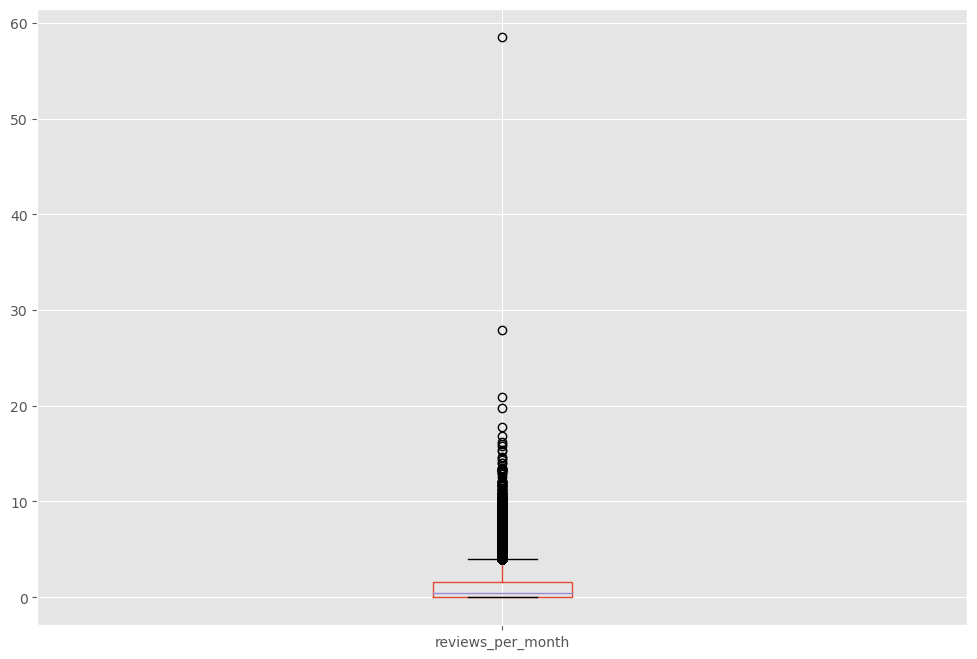

In [40]:
new_data.boxplot(column=['reviews_per_month'])

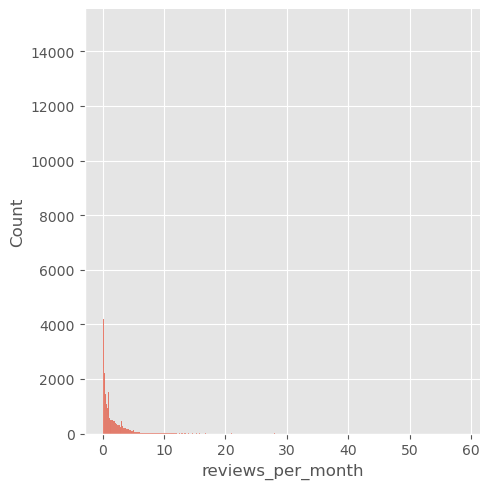

In [45]:
sns.displot(new_data['reviews_per_month'])

In [46]:
upper = new_data['reviews_per_month'].mean() + 3*new_data['reviews_per_month'].std()
lower = new_data['reviews_per_month'].mean() - 3*new_data['reviews_per_month'].std()
print('Upper:',upper,'|','Lower:',lower)

Upper: 5.898037195334846 | Lower: -3.704608188581428


In [47]:
new_data.loc[(new_data['reviews_per_month'] > upper) | (new_data['reviews_per_month'] < lower)].head()

,id,name,host_id,host_name,neighbourhood_group,neighbourhood,latitude,longitude,room_type,price,minimum_nights,number_of_reviews,last_review,reviews_per_month,calculated_host_listings_count,availability_365
471,166172,LG Private Room/Family Friendly,792159,Wanda,Brooklyn,Bushwick,40.70283,-73.92131,Private room,60,3,480,2019-07-07,6.70,1,0
534,195233,Hospitality on Propsect Pk-12 yrs Hosting Lega...,949221,Dennis,Brooklyn,Prospect-Lefferts Gardens,40.65513,-73.95641,Private room,43,1,401,2019-07-04,6.62,2,43
553,205043,Modern Condo in Midtown,1007558,Welcome To My Place,Manhattan,Theater District,40.75895,-73.98830,Private room,150,1,330,2019-06-20,7.14,1,111
1614,732700,Centrally located and spacious apt.,3815537,Reshma,Manhattan,Midtown,40.75154,-73.97104,Entire home/apt,106,7,10,2019-07-06,10.00,1,0
1627,741154,Beautiful duplex loft with Skylight,1406458,Nancy,Manhattan,Tribeca,40.71778,-74.00452,Entire home/apt,210,14,10,2019-07-04,10.00,1,0


In [48]:
new_data2 = new_data.loc[(data['reviews_per_month'] < upper) & (new_data['reviews_per_month'] > lower)]
print('old data:', len(new_data))
print('new data:', len(new_data2))
print('outliers removed:', len(new_data)-len(new_data2))

old data: 48568
new data: 47726
outliers removed: 842


In [49]:
sort3 = new_data2.sort_values(by=['reviews_per_month'], inplace=False, ascending=False)
sort3.head()

,id,name,host_id,host_name,neighbourhood_group,neighbourhood,latitude,longitude,room_type,price,minimum_nights,number_of_reviews,last_review,reviews_per_month,calculated_host_listings_count,availability_365
18592,14693952,Private Small Room 4,59529529,Han,Manhattan,Hell's Kitchen,40.76190,-73.99500,Private room,75,1,205,2019-07-07,5.89,6,179
29581,22705516,The Quietest Block in Manhattan :),127740507,Kathleen,Manhattan,Harlem,40.83102,-73.94181,Private room,65,2,103,2019-07-07,5.89,2,0
18396,14464699,ENTIRE FLOR :) PRIVATE entrance&full bathroom! :D,3441272,Jasmin,Brooklyn,Bushwick,40.69972,-73.93192,Private room,110,1,208,2019-06-24,5.89,5,293
44362,34199108,Beautiful apartment in Manhattan!,130155462,Fred,Manhattan,Financial District,40.70578,-74.00769,Entire home/apt,280,2,11,2019-06-26,5.89,1,182
2163,999248,TriBeCa 2500 Sq Ft w/ Priv Elevator,273174,Jon,Manhattan,Tribeca,40.71927,-74.00453,Entire home/apt,575,1,447,2019-07-01,5.89,3,207


# <font size="15">Plotting:</font>

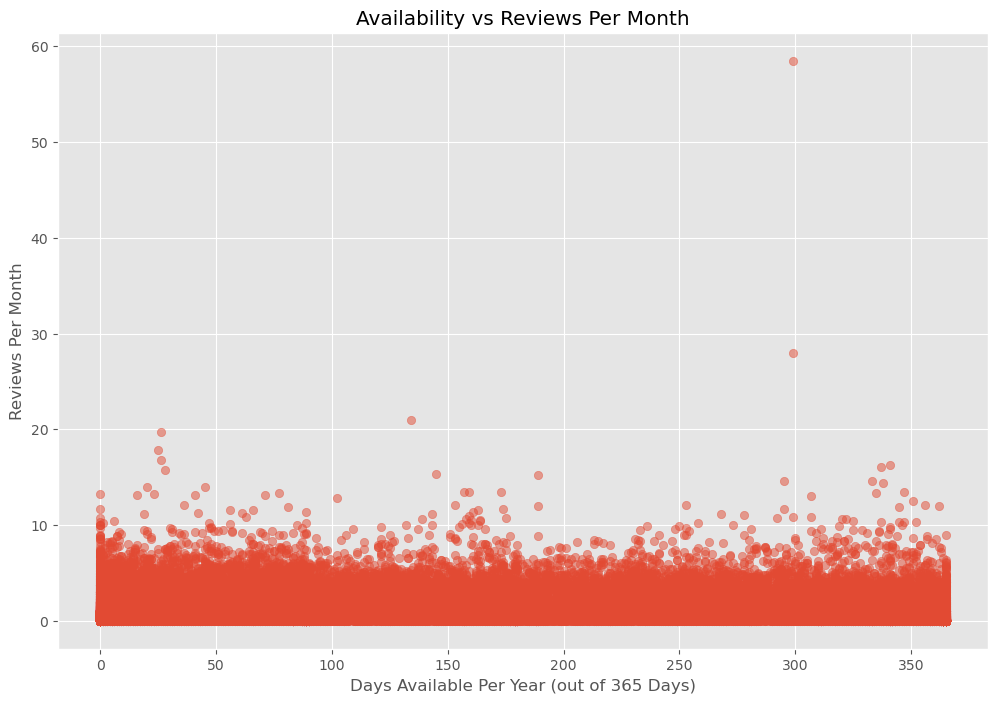

In [50]:
#does availability have any correlation with how people review the property?
#I predict not because in the app, there is a filter within the app in which the customer can choose which days they want to rent and would most likely not affect average reviews per month
plt.scatter(x=new_data['availability_365'], y=new_data['reviews_per_month'], alpha=0.5)
plt.title('Availability vs Reviews Per Month')
plt.xlabel('Days Available Per Year (out of 365 Days)')
plt.ylabel('Reviews Per Month')
plt.show()

[Text(0.5, 1.0, 'Availability vs Reviews Per Month'),
 Text(0.5, 0, 'Days Available Per Year (out of 365 Days)'),
 Text(0, 0.5, 'Reviews Per Month')]

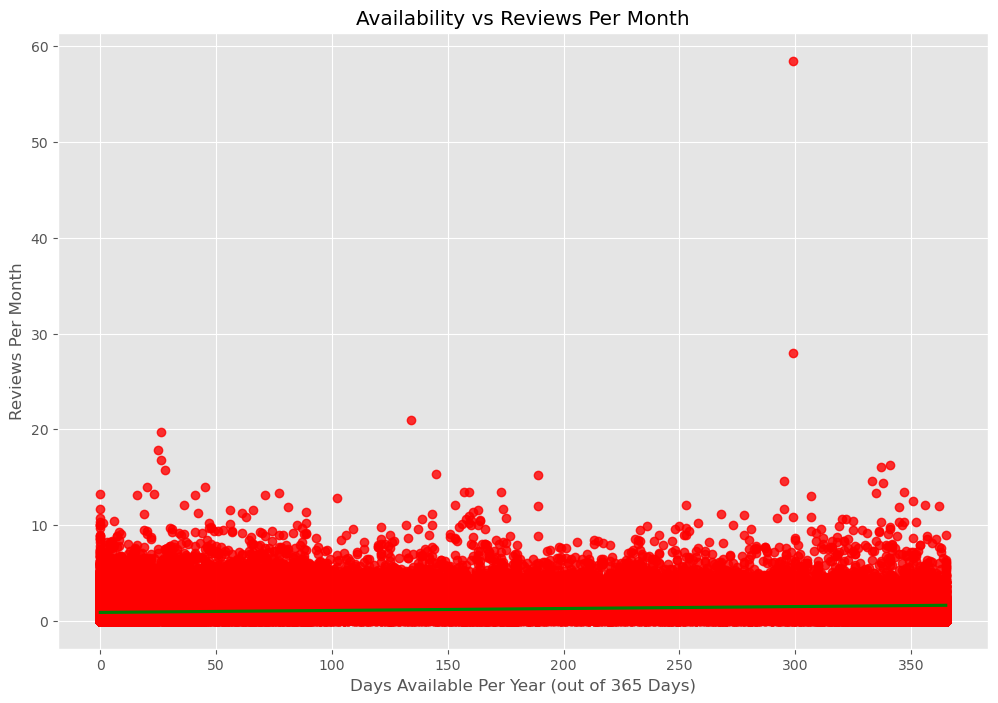

In [51]:
#convert the information above into a regplot
#the red dots show the data plotted and the green line is the trend shown

sns.regplot(x="availability_365", y="reviews_per_month", data=new_data, scatter_kws={"color": "red"}, line_kws={"color": "green"}).set(title='Availability vs Reviews Per Month',xlabel='Days Available Per Year (out of 365 Days)', ylabel='Reviews Per Month')

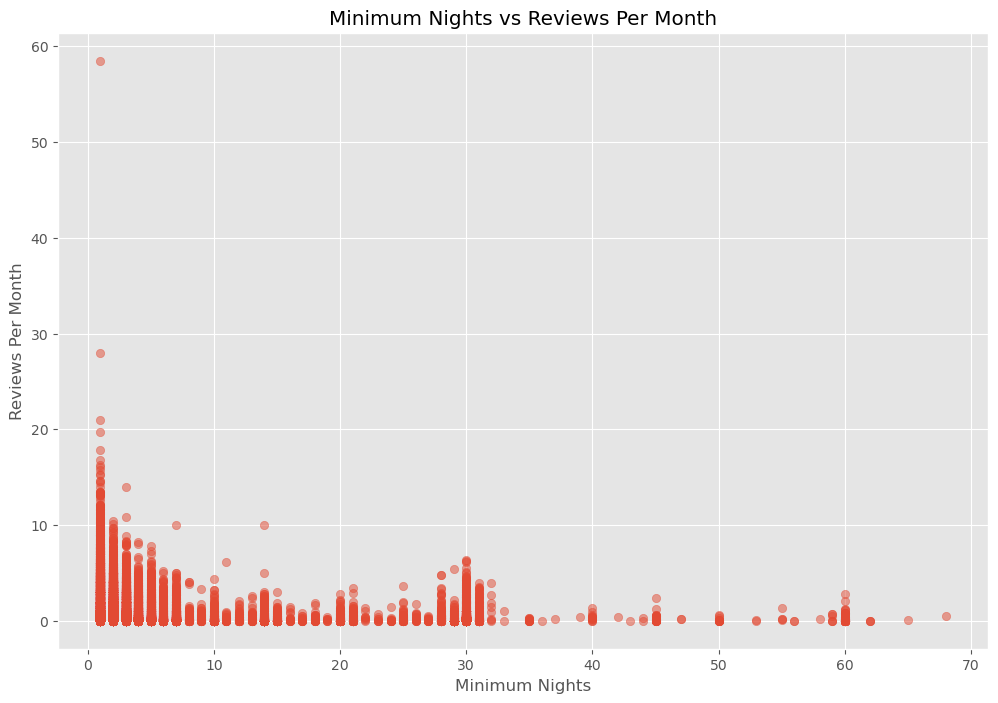

In [52]:
plt.scatter(x=new_data['minimum_nights'], y=new_data['reviews_per_month'], alpha=0.5)
plt.title('Minimum Nights vs Reviews Per Month')
plt.xlabel('Minimum Nights')
plt.ylabel('Reviews Per Month')
plt.show()

[Text(0.5, 1.0, 'Minimum Nights vs Reviews Per Month'),
 Text(0.5, 0, 'Minimum Nights'),
 Text(0, 0.5, 'Reviews Per Month')]

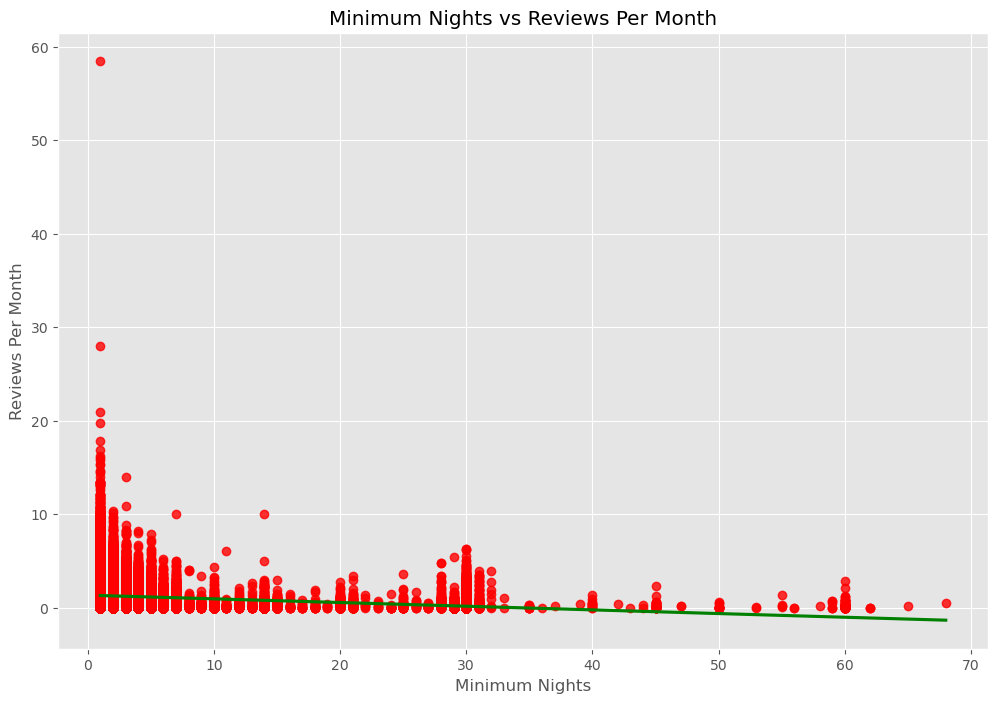

In [53]:
#because we removed outliers, out scatter plot will be more representative of the actual statistics

sns.regplot(x="minimum_nights", y="reviews_per_month", data=new_data, scatter_kws={"color": "red"}, line_kws={"color": "green"}).set(title='Minimum Nights vs Reviews Per Month',xlabel='Minimum Nights', ylabel='Reviews Per Month')
#this shows us that the longer minimum nights that are requested via the renter, the less reviews per month they receive. This matches my hypothesis.
#there is a lot of valume in listings that have lower number of minimum nights and would provide the greatest ROI if an airbnb seller used this information to maximize profits